<a href="https://colab.research.google.com/github/limgan/LiminalGan/blob/main/LimnalGan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

hark look upon what has been wrought and weep

or not idk, im not ur dad

In [1]:
#check to make sure you are using a gpu, otherwise this shit wont work
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sun Apr  4 05:05:30 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.67       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

gettin all the shit we need


In [2]:
!git clone https://github.com/RoyWheels/stylegan2-ada.git   
%cd stylegan2-ada
!git clone https://github.com/limgan/limgan.github.io
!mv limgan.github.io/generate_interp_movie.py .
!mv limgan.github.io/generate_grid.py .
%tensorflow_version 1.x
!mkdir /content/out/
!mkdir /content/out/images
!mkdir /content/out/movies
!mkdir /content/out/mixing
!mkdir /content/out/projector
!mkdir /content/models/
!pip install moviepy

fatal: destination path 'stylegan2-ada' already exists and is not an empty directory.
/content/stylegan2-ada
fatal: destination path 'limgan.github.io' already exists and is not an empty directory.
mv: cannot stat 'limgan.github.io/generate_interp_movie.py': No such file or directory
mv: cannot stat 'limgan.github.io/generate_grid.py': No such file or directory
TensorFlow 1.x selected.
mkdir: cannot create directory ‘/content/out/’: File exists
mkdir: cannot create directory ‘/content/out/images’: File exists
mkdir: cannot create directory ‘/content/out/movies’: File exists
mkdir: cannot create directory ‘/content/out/mixing’: File exists
mkdir: cannot create directory ‘/content/out/projector’: File exists
mkdir: cannot create directory ‘/content/models/’: File exists


mount your drive and put the path to the tar.gz of the models, models are too big to host on github unfortunately without paying some dosh

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
!tar -xvf  '/content/drive/MyDrive/liminalgan_models/limgan_models.tar.gz' -C '/content/models'

liminal_exterior/
liminal_exterior/network-snapshot-002120.pkl
liminal_exterior/network-snapshot-002360.pkl
liminal_interior/
liminal_interior/network-snapshot-002320.pkl
liminal_interior/network-snapshot-002520.pkl
liminal_interior_mirrored/
liminal_interior_mirrored/network-snapshot-002240.pkl
liminal_interior_mirrored/network-snapshot-002360.pkl


more setup

In [5]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"]="2"
import tensorflow as tf
tf.logging.set_verbosity(tf.logging.ERROR)
import numpy as np
models_list = ['/content/models/liminal_exterior/network-snapshot-002120.pkl',
               '/content/models/liminal_exterior/network-snapshot-002360.pkl',
               '/content/models/liminal_interior/network-snapshot-002320.pkl',
               '/content/models/liminal_interior/network-snapshot-002520.pkl',
               '/content/models/liminal_interior_mirrored/network-snapshot-002240.pkl',
               '/content/models/liminal_interior_mirrored/network-snapshot-002360.pkl'] 
from IPython.display import Image, display


----------

## Models explaination:

contained in the tar.gz file are 6 compressed models, 3 with different training conditions

----

models/liminal_exterior:  snapshot-2120 & snapshot-2360  

Model was trained on 1300 exterior liminal spaces with ADA and no mirroring 

----



models/liminal_interior:  snapshot-2520 & snapshot-2320 

Model was trained on ~2500 interior liminal spaces with ADA and no mirroring 

----


models/liminal_interior_mirroed:  snapshot-2520 & snapshot-2320 

Model was trained on ~2500 interior liminal spaces with ADA and WITH mirroring 

----



## Generate random image from random model

To not get a random model, change model = to a path to one of the pkl files.

ex:  ```model = 'content\models\liminal_interior\network-snapshot-0023020.pkl'```

To not get a random seed change random seed to a value instead of {random_seed}



* trunc - the cutoff PSI, trained at .75 so that is the best. Higher say .8 is wilder but less accurate, lower like .5 is more consistent but little variation 

-------------

Alternately you can pass seeds a list like this:

```seeds=1,2,3,4,5,6\``` 

and it will generate all those seeds and save them for you

In [24]:
model = models_list[np.random.randint(len(models_list))]
random_seed = np.random.randint(0,0x7FFFFFFE)

print(model)
!python generate_images.py --network={model}\
    --seeds={random_seed}\
    --trunc=.76 \
    --outdir=/content/out/images/\

display(Image('/content/out/images/seed%d.png'%random_seed ))

/content/models/liminal_interior/network-snapshot-002320.pkl
1,2,3,4,5
1,2,3,4,5
1,2,3,4,5
['1', '2', '3', '4', '5']
Loading networks from "/content/models/liminal_interior/network-snapshot-002320.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Loading... Done.
Generating image for seed 1 (0/5) ...
Generating image for seed 2 (1/5) ...
Generating image for seed 3 (2/5) ...
Generating image for seed 4 (3/5) ...
Generating image for seed 5 (4/5) ...


------------------------

## Generate interpolation videos

* trunc - the cutoff PSI, trained at .75 so that is the best. Higher say .8 is wilder but less accurate, lower like .5 is more consistent but little variation 
* duration - duration of the video to generate in seconds
* smoothing - how smooth to interpolate between the given frames, increasing this will slow the video speeds interpolation between generated images
* fps - how may frames per second to generate
* audio - path to an audio file if wanted, it will cut the audio file from the end to match the duration of the video generated

In [31]:
model = models_list[np.random.randint(len(models_list))]
random_seed = np.random.randint(0,0x7FFFFFFE)
print(model)
!python generate_interp_movie.py --network={model}\
    --seeds={random_seed}\
    --trunc=.8 \
    --outdir=/content/out/movies/\
    --audio=/content/drive/MyDrive/13_angels_no_violin.mp3\
    --fps=30\
    --duration=15\
    --smoothing=2\
    --name=interp\



/content/models/liminal_interior/network-snapshot-002320.pkl
Loading networks from "/content/models/liminal_interior/network-snapshot-002320.pkl"...
Generating latent vectors...
Setting up TensorFlow plugin "fused_bias_act.cu": Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Loading... Done.
[MoviePy] >>>> Building video /content/out/movies/interp_945461038.mp4
[MoviePy] Writing audio in interp_945461038TEMP_MPY_wvf_snd.mp3
100% 331/331 [00:00<00:00, 852.61it/s]
[MoviePy] Done.
[MoviePy] Writing video /content/out/movies/interp_945461038.mp4
100% 450/451 [00:16<00:00, 26.65it/s]
[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/out/movies/interp_945461038.mp4 



-----------

## Generate a grid of images

* gridsize - The size of the square to use, 5 = a 5x5 grid of images



/content/models/liminal_exterior/network-snapshot-002360.pkl
Loading networks from "/content/models/liminal_exterior/network-snapshot-002360.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Loading... Done.
Generating images for grid...
(2590, 2590, 3)


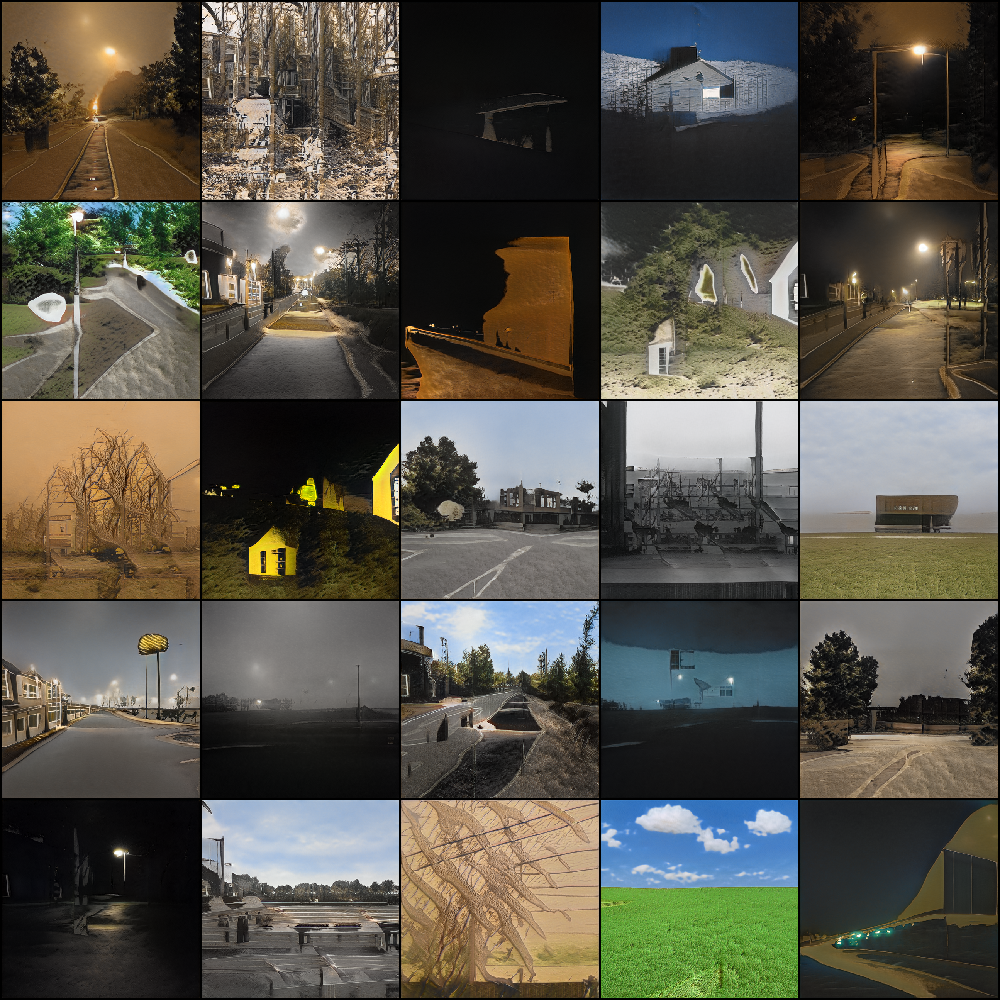

In [8]:
model = models_list[np.random.randint(len(models_list))]
random_seed = np.random.randint(0,0x7FFFFFFE)
print(model)
!python generate_grid.py --network={model}\
    --rngseed={random_seed}\
    --trunc=.75 \
    --gridsize=5\
    --outdir=/content/out/images/\

display(Image('/content/out/images/grid_seed%d.png'%random_seed ))

## Generate a grid interpolation (latent space mixing)

This essentially lets you mix particular images you like 

So in the grid, the top row is mixed with the outer left column, as such:

```
blank     x0      x1      x2      x3    
----------------------------------------
y0 |   x0+y0   x1+y0   x2+y0   x3+y0
y1 |   x0+y1   x1+y1   x2+y1   x3+y1
y2 |   x0+y2   x1+y2   x2+y2   x3+y2




/content/models/liminal_interior_mirrored/network-snapshot-002360.pkl
Loading networks from "/content/models/liminal_interior_mirrored/network-snapshot-002360.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Loading... Done.
Generating W vectors...
Generating images...
Generating style-mixed images...
Saving images...
Saving image grid...


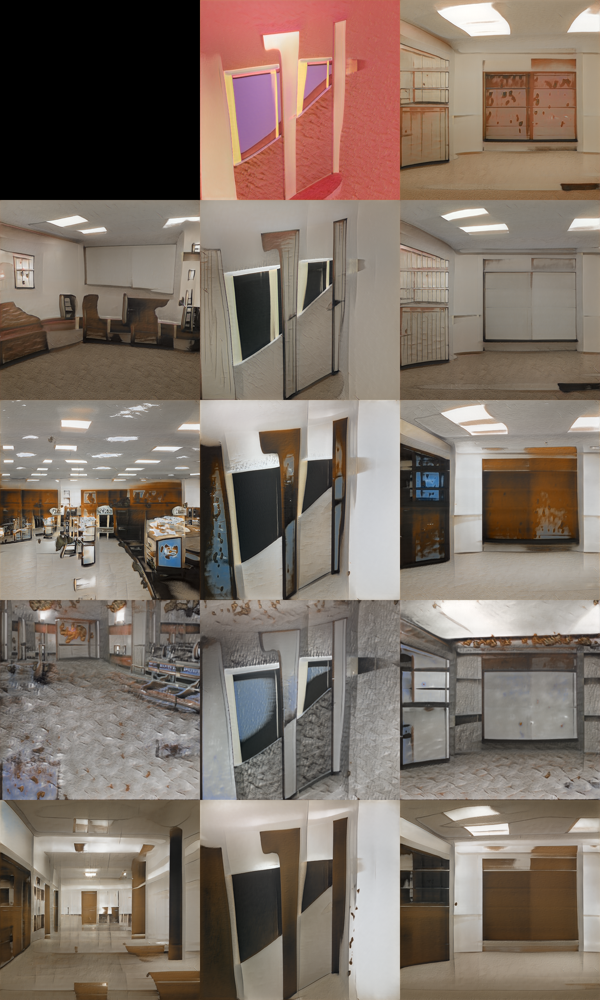

In [24]:

model = models_list[np.random.randint(len(models_list))]
random_seed = np.random.randint(0,65535)
print(model)
!python style_mixing.py --network={model}\
    --rows=10,15,25,45\
    --cols=3,2\
    --trunc=.75 \
    --outdir=/content/out/mixing/\

display(Image('/content/out/mixing/grid.png' ))

-----

## Project these models onto an image

Use the model to make an image as close as possible to the one its fed

**This will take a while**

/content/models/liminal_interior_mirrored/network-snapshot-002240.pkl
Loading networks from "/content/models/liminal_interior_mirrored/network-snapshot-002240.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Loading... Done.
Projector: Computing W midpoint and stddev using 10000 samples...
Projector: std = 10.3381
Projector: Setting up noise inputs...
Projector: Building image output graph...
Projector: Building loss graph...
Projector: Building noise regularization graph...
Projector: Setting up optimizer...
Projector: Preparing target images...
Projector: Initializing optimization state...
100% 1000/1000 [02:54<00:00,  5.73it/s, dist=0.2647, loss=0.26]


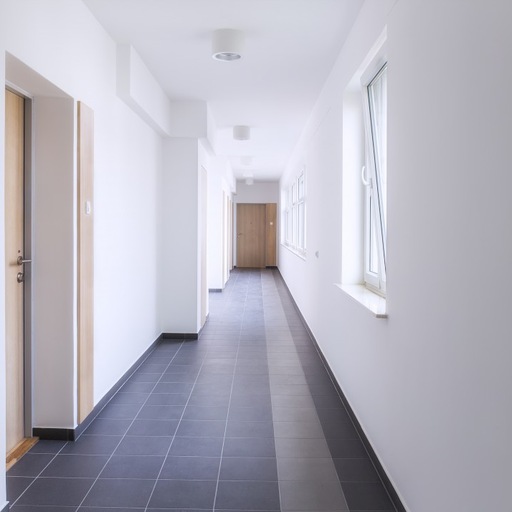

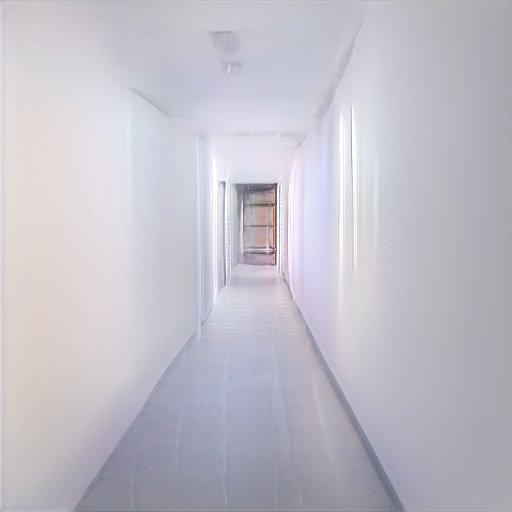

In [32]:
model = models_list[np.random.randint(len(models_list))]
random_seed = np.random.randint(0,65535)
print(model)
!python projector.py --network={model}\
    --outdir=/content/out/projector/\
    --target=/content/drive/MyDrive/example_hallway.jpg\

display(Image('/content/out/projector/target.png' ))
display(Image('/content/out/projector/proj.png' ))


In [35]:
## doesnt work lol will fix
print(model)
!python generate.py --network={model}\
    --trunc=.76 \
    --outdir=/content/out/projector/\
    --dlatents=/content/out/projector/dlatents.npz

display(Image('/content/out/images/seed%d.png'%random_seed ))

/content/models/liminal_interior_mirrored/network-snapshot-002240.pkl
Loading networks from "/content/models/liminal_interior_mirrored/network-snapshot-002240.pkl"...
Generating images from dlatents file "/content/out/projector/dlatents.npz"
Traceback (most recent call last):
  File "generate.py", line 121, in <module>
    main()
  File "generate.py", line 116, in main
    generate_images(**vars(args))
  File "generate.py", line 36, in generate_images
    assert dlatents.shape[1:] == (18, 512) # [N, 18, 512]
AssertionError
